In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon, Rectangle, RegularPolygon
from matplotlib.collections import PatchCollection
from matplotlib.colors import ListedColormap
import matplotlib.image as mpimg
import imageio
from PIL import Image
import yaml
import glob
import sys
from scipy.ndimage import gaussian_gradient_magnitude
import matplotlib.gridspec as gridspec

In [3]:
os.chdir("../../")

In [4]:
from cvmt.data.utils import read_harmonized_hdf5, compute_edges_canny

/home/samehr/miniconda3/envs/cephal/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2023-10-23 16:51:01,581	INFO util.py:159 -- Missing packages: ['ipywidgets']. Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


## be aware of your current directory

In [5]:
print(os.getcwd())

/home/samehr/code/cvmt


## load parameters

In [6]:
with open("configs/params.yaml") as f:
    params = yaml.safe_load(f)

## load metadata table

In [7]:
metadata_filepath = os.path.join(
    params['PRIMARY_DATA_DIRECTORY'],
    "metadata.hdf5",
)

In [8]:
metadata = pd.read_hdf(metadata_filepath, key='df',)

In [9]:
metadata.head(3)

,valid_v_annots,valid_f_annots,edges_present,harmonized_id,source_image_filename,dataset,dev_set,v_annots_2_rows,v_annots_2_cols,v_annots_3_rows,v_annots_3_cols,v_annots_4_rows,v_annots_4_cols,f_annots_rows,f_annots_cols,age,grouping_factor,split
0,True,False,True,87e099255d6c3daf26a7,3.jpg,dataset_1,NaN,3.0,2.0,5.0,2.0,5.0,2.0,NaN,NaN,NaN,dataset_1,train
1,True,False,True,82e2b0e6856c68ee2054,13.jpg,dataset_1,NaN,3.0,2.0,5.0,2.0,5.0,2.0,NaN,NaN,NaN,dataset_1,train
2,True,False,True,01146532bcbd82a8ef4e,76.jpg,dataset_1,NaN,3.0,2.0,5.0,2.0,5.0,2.0,NaN,NaN,NaN,dataset_1,val


## create images directory under artifacts dir

In [10]:
artifacts_graph_dir = os.path.join(params['ARTIFACTS_DATA_DIRECTORY'], params['ARTIFACTS_GRAPHS_DIR_NAME'])
if not os.path.exists(artifacts_graph_dir):
    os.makedirs(artifacts_graph_dir)

## load and imshow a few sample images

In [11]:
filtered_rows = metadata.query('valid_v_annots==True')

In [12]:
filtered_rows = filtered_rows.groupby('dataset').sample(15)

In [13]:
filtered_rows.iloc[6,:]

valid_v_annots                           True
valid_f_annots                          False
edges_present                            True
harmonized_id            1f2feba70f5a16471531
source_image_filename                   4.jpg
dataset                             dataset_1
dev_set                                   NaN
v_annots_2_rows                           3.0
v_annots_2_cols                           2.0
v_annots_3_rows                           5.0
v_annots_3_cols                           2.0
v_annots_4_rows                           5.0
v_annots_4_cols                           2.0
f_annots_rows                             NaN
f_annots_cols                             NaN
age                                       NaN
grouping_factor                     dataset_1
split                                     val
Name: 39, dtype: object

dataset_1
38cf2763cf795be7c595



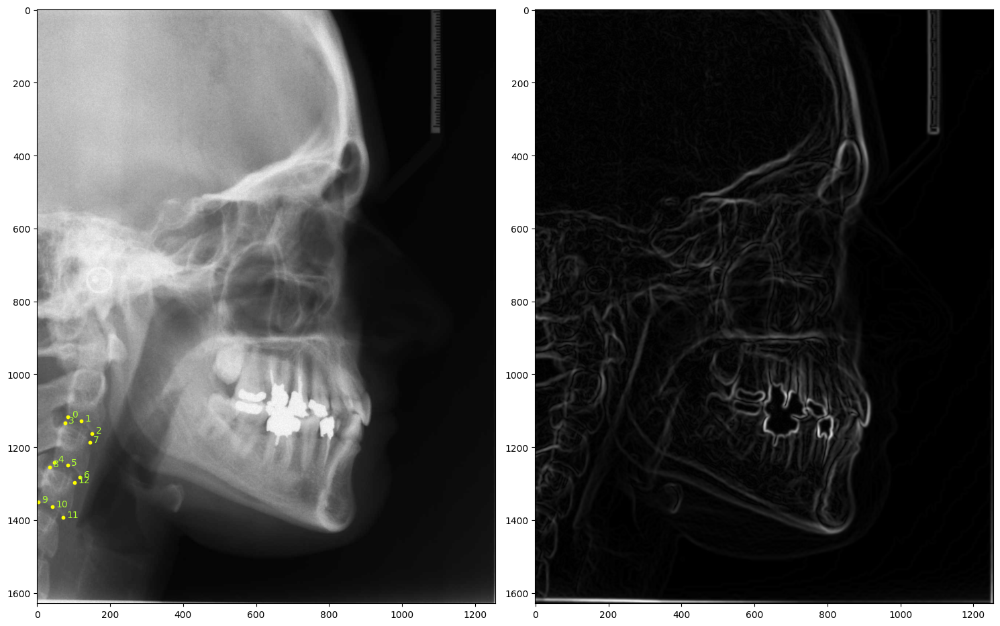

dataset_1
c14117287b93ee1bc70a



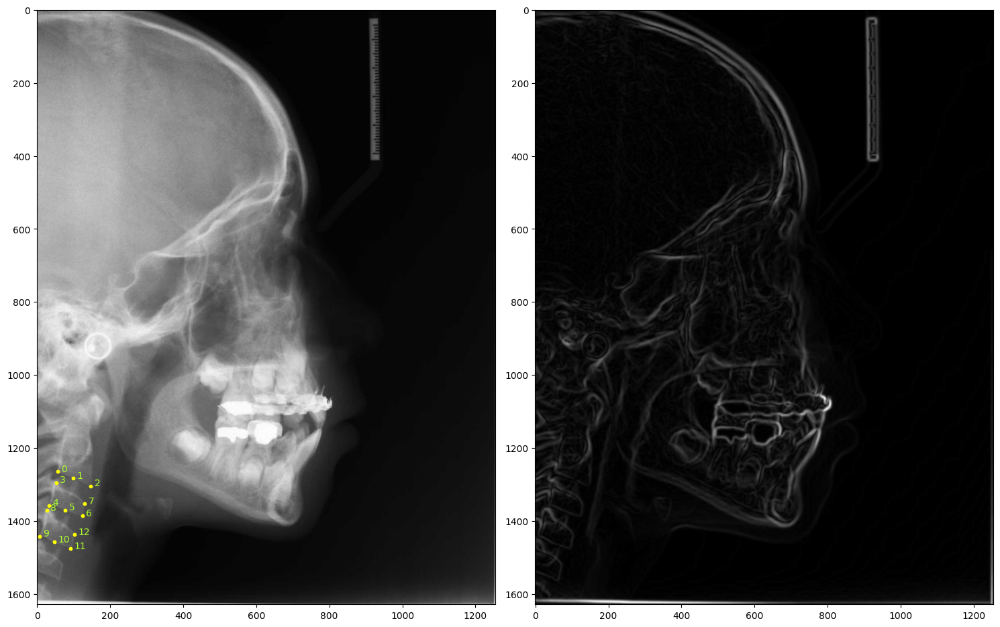

dataset_1
ae4cbf20cad642ed422a



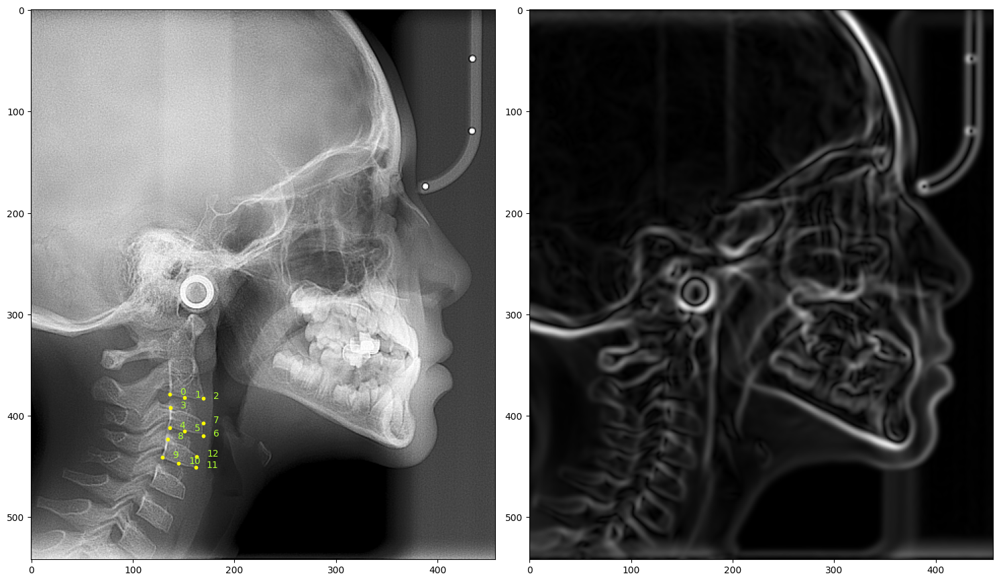

dataset_1
e285283f74763448a36c



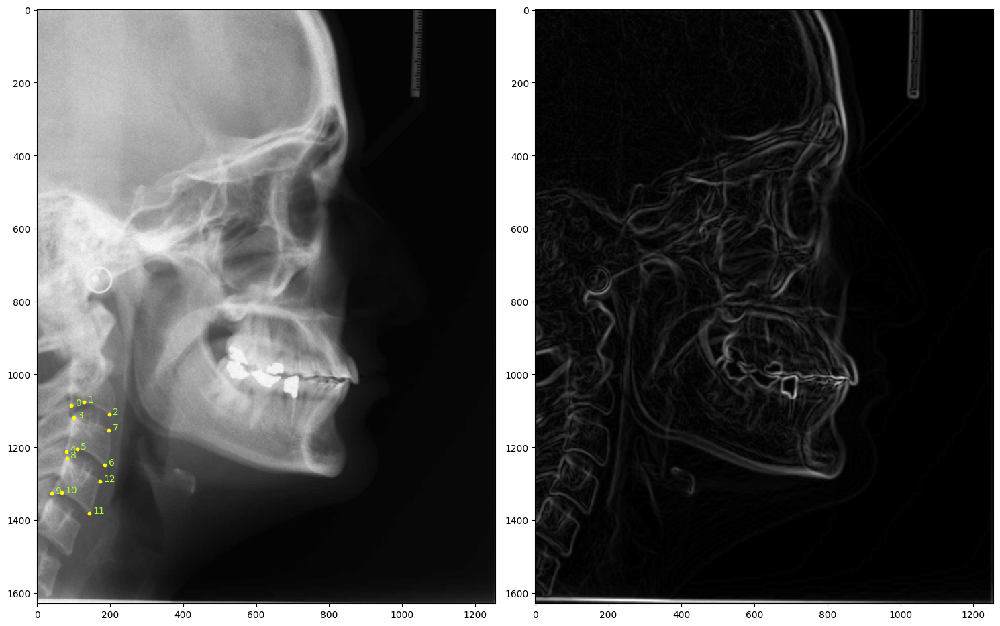

dataset_1
ecda60c09a1612865cea



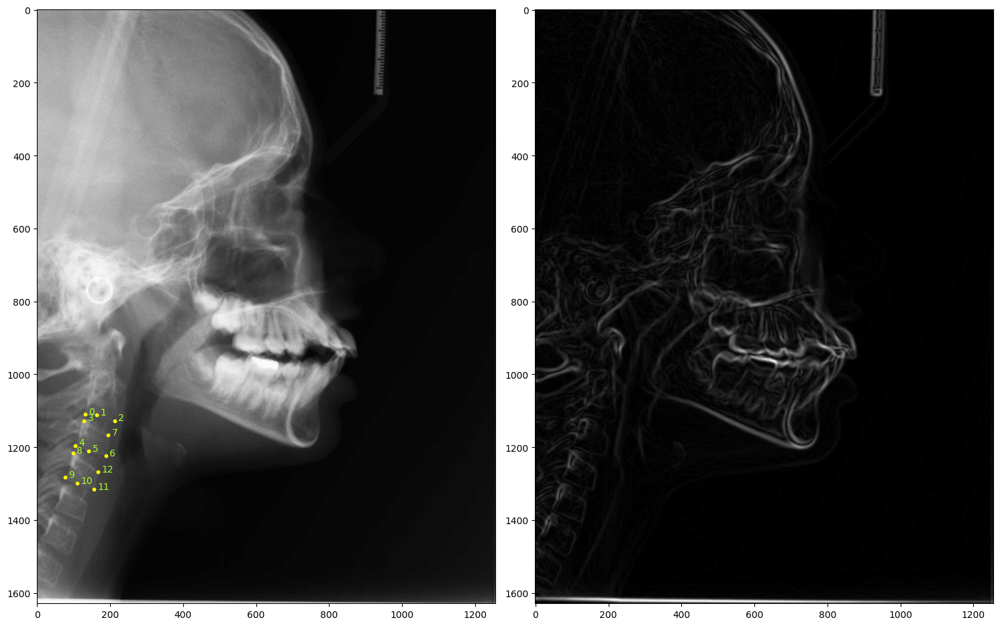

dataset_2
6eb40f3dc8e2bb95167f



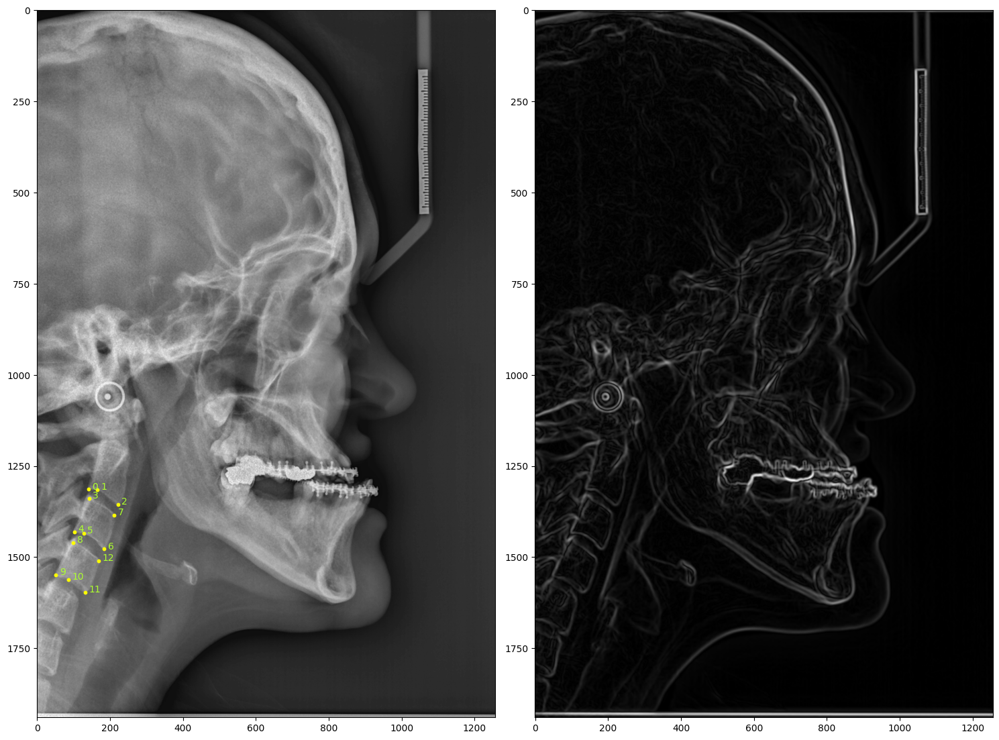

dataset_2
5788678f1f4f326f48e2



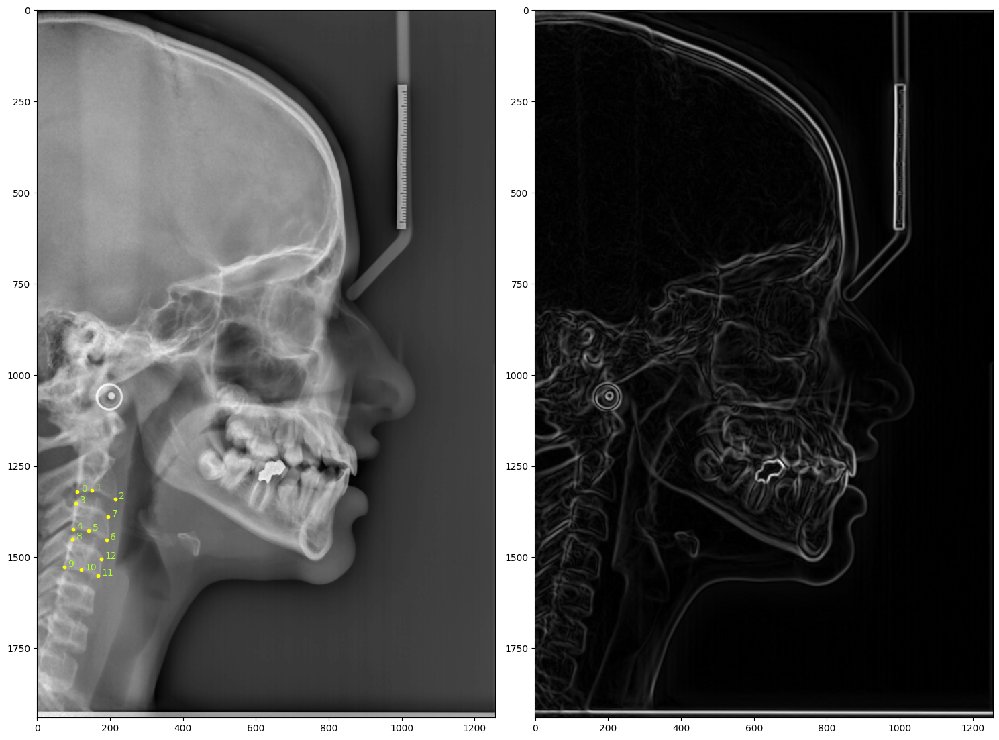

dataset_2
d008c80f5dd5ae5ff0fd



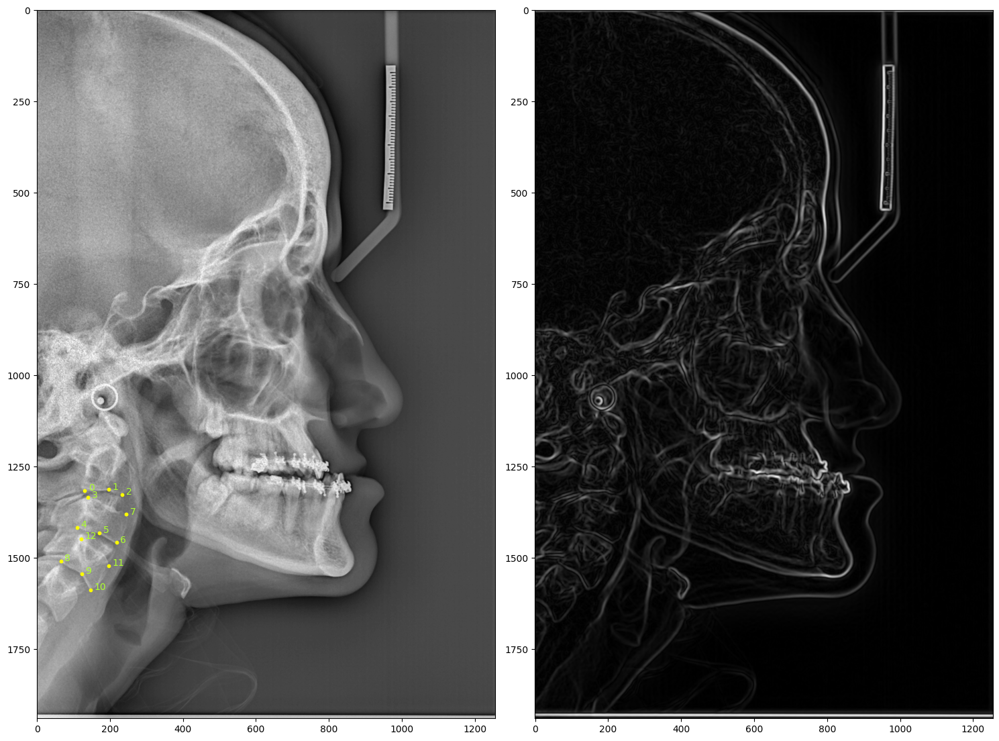

dataset_3
8feb8cba14e8eaf87ff4



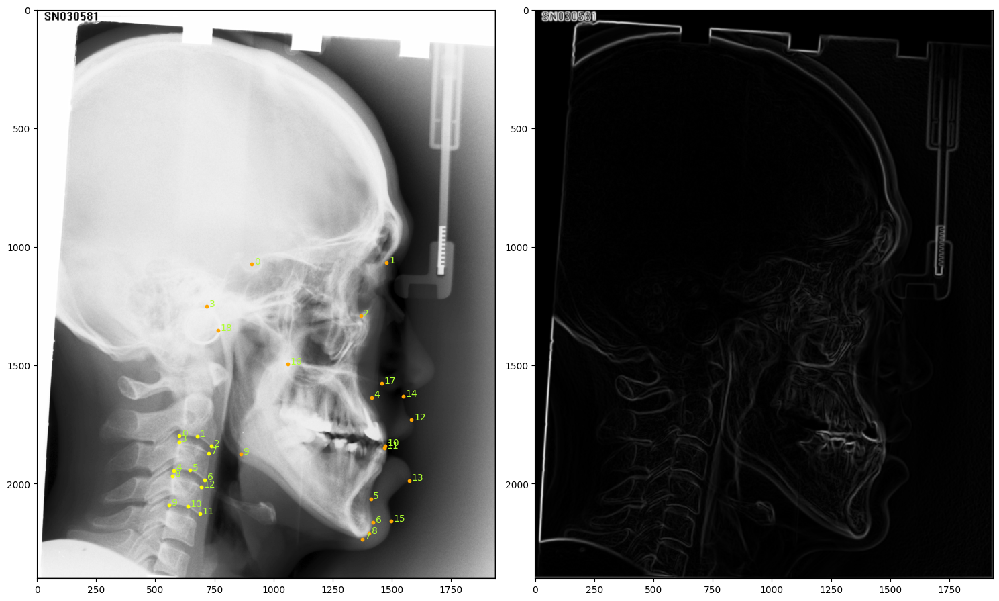

dataset_3
ea37d8980c772f156b39



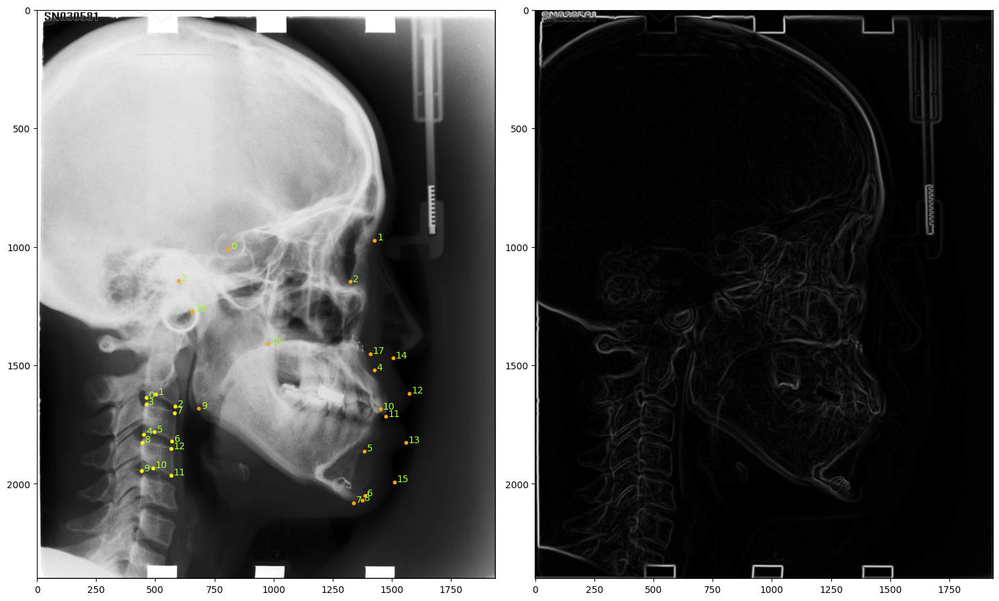

dataset_3
aea7ba5a41039fce90be



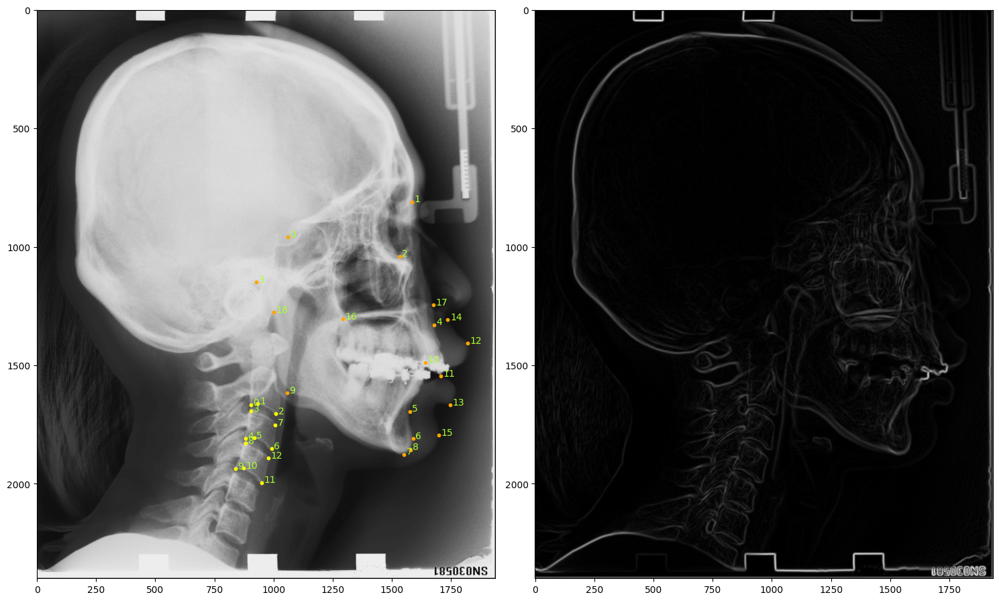

dataset_3
ac7c23e184230160b313



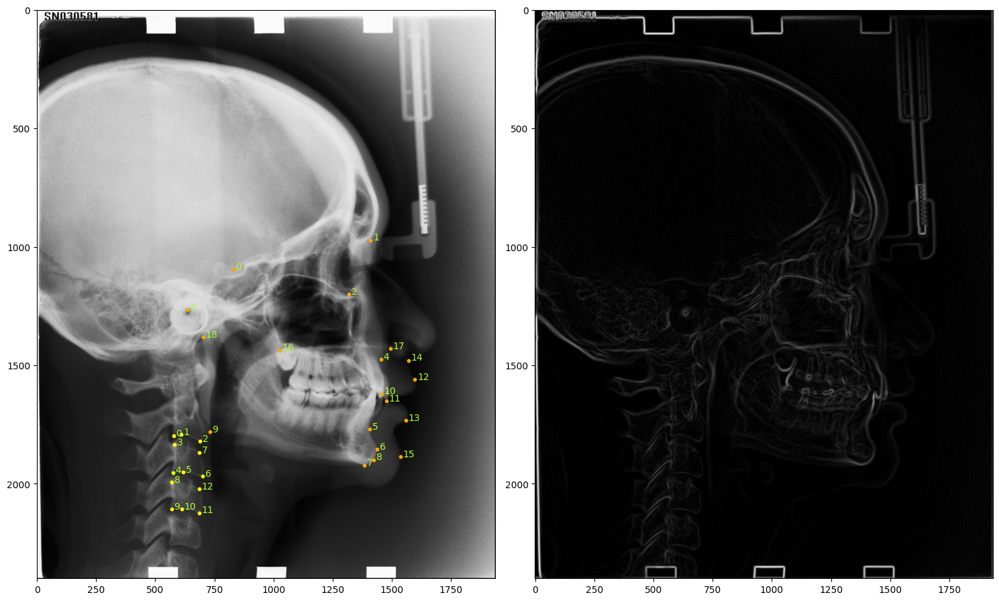

dataset_4
e87afce918ba7204e839



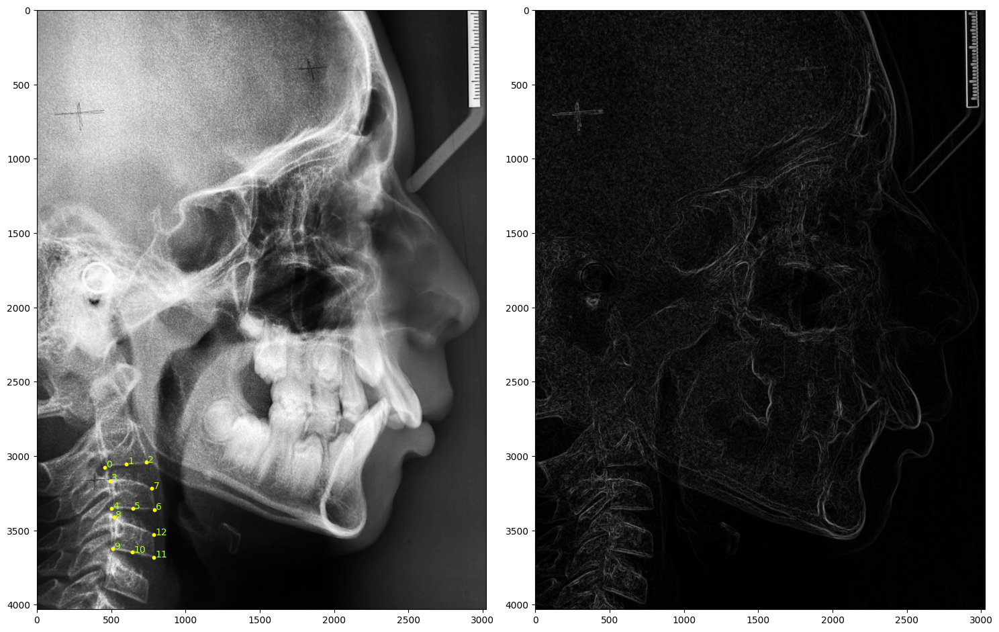

dataset_4
d365c05706b638d0199c



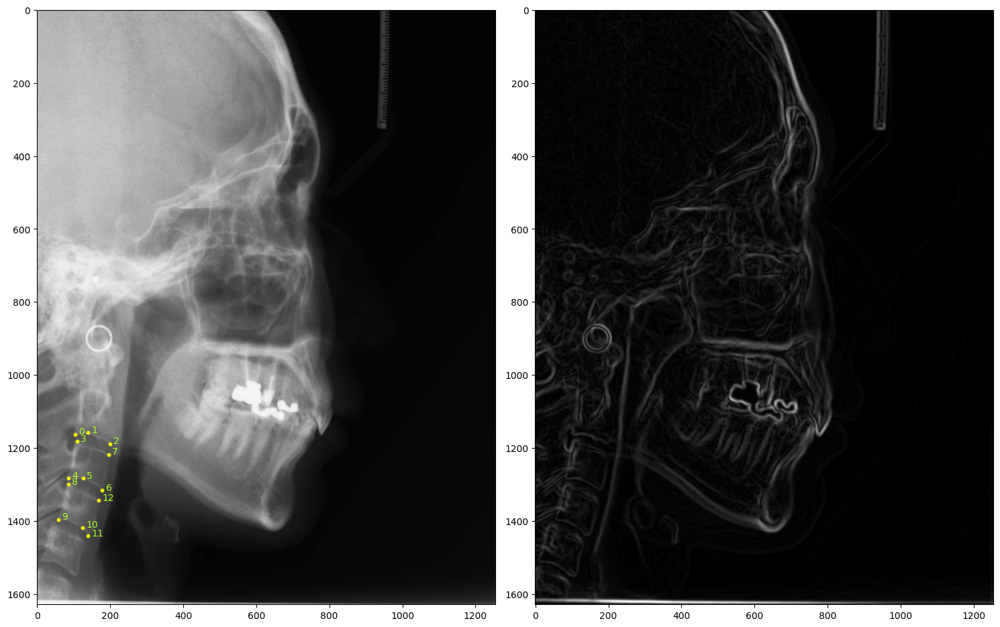

dataset_4
dd4d7c3170fe07504491



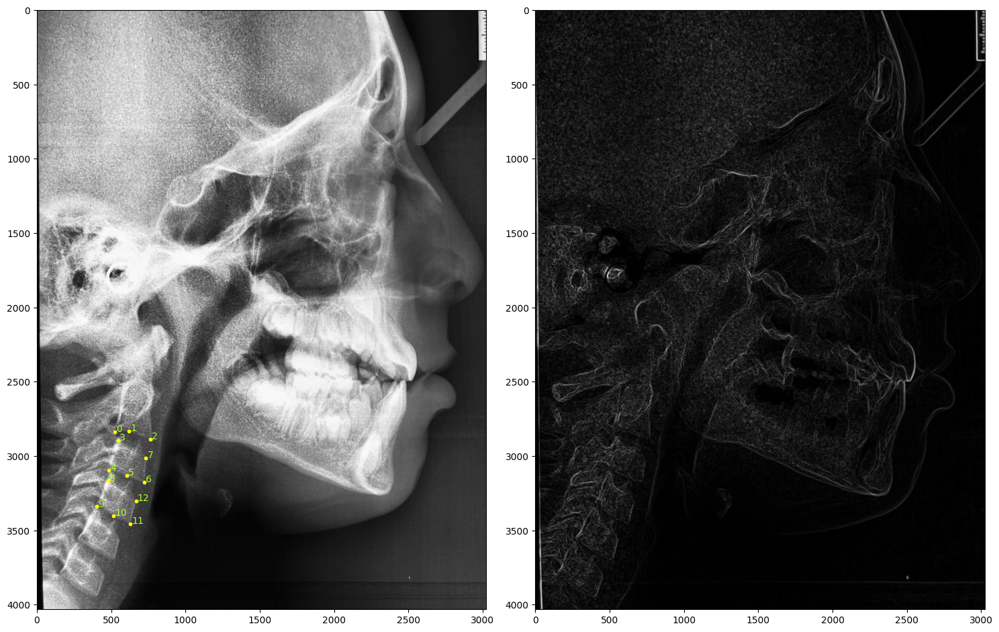

In [16]:
for row in filtered_rows.to_dict('records'):
    if np.random.random() < 0.7:
        continue
    harmonized_id = row['harmonized_id']
    filename = harmonized_id+ '.hdf5'
    filepath = os.path.join(params['PRIMARY_DATA_DIRECTORY'], filename)
    dataset = row['dataset']
    print(dataset)
    print(harmonized_id)
    print()
    
    ## plot the image and the landmarks
    image, edges, v_landmarks, f_landmarks = read_harmonized_hdf5(filename, primary_data_dir=params['PRIMARY_DATA_DIRECTORY'])

    image_normalized = image/255.0

    # create a new figure
    fig = plt.figure(tight_layout=True, figsize=(15,20))
    gs = gridspec.GridSpec(1, 2)

    # show the image
    ax = fig.add_subplot(gs[0])
    ax.imshow(image, cmap='gray')

    # plot the landmarks on top of the image
    if v_landmarks['v_landmarks'] is not None:
        v_landmarks_arr = np.vstack(v_landmarks['v_landmarks'])
        ax.scatter(v_landmarks_arr[:, 0], v_landmarks_arr[:, 1], s=10, c='yellow')
        for i, landmark in enumerate(v_landmarks_arr):
            ax.text(landmark[0]+10, landmark[1], str(i), color='greenyellow')  # Annotate the index

    if f_landmarks['f_landmarks'] is not None:
        f_landmarks_arr = np.vstack(f_landmarks['f_landmarks'])
        ax.scatter(f_landmarks_arr[:, 0], f_landmarks_arr[:, 1], s=10, c='orange')
        for i, landmark in enumerate(f_landmarks_arr):
            ax.text(landmark[0]+10, landmark[1], str(i), color='greenyellow')  # Annotate the index
    
    ax = fig.add_subplot(gs[1])
    ax.imshow(edges, cmap='gray')
    # title
    # plt.suptitle("dataset is {}".format(dataset))
    # display the plot
    plt.tight_layout()
    plt.show()
    plt.pause(1)
    #save_path = os.path.join(artifacts_graph_dir, harmonized_id+'.jpeg')
    #fig.savefig(save_path, bbox_inches='tight')